In [16]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import random
import statistics
from scipy.optimize import curve_fit
from scipy.stats import truncnorm

In [5]:
import os

# Define default path for saving figures
FIGURE_DIR = "/Users/boyapeng/Library/CloudStorage/OneDrive-UTHealthHouston/Dissertation/Bi/Measles/fig"

# Create the directory if it doesn't exist
os.makedirs(FIGURE_DIR, exist_ok=True)

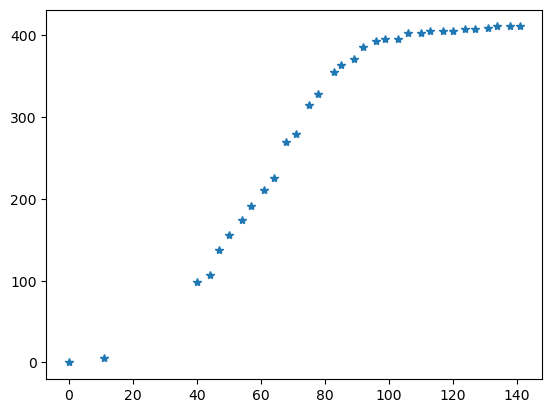

In [2]:
GC = pd.read_csv('gaines_case.csv')
y_case = GC['Cumulative Cases'].to_numpy()
x_case = GC['t'].to_numpy()
plt.plot(x_case,y_case, '*')

In [6]:
#define paramters
#VE for three age group epsilon
epsilon=[0.93, 0.97, 0.97]

#Exposed to infectious rate, sigma
sigma_ub=float(1/7)
sigma_lb=float(1/14)
sigma_pe=(sigma_ub+sigma_lb)/2

#I to R rate, gamma 1
gamma1_ub=float(1/4)
gamma1_lb=float(1/7)
gamma1_pe=(gamma1_ub+gamma1_lb)/2

#H to R rate, gamma 2
gamma2_ub=float(1/5)
gamma2_lb=float(1/6)
gamma2_pe=(gamma2_ub+gamma2_lb)/2

#IHR
IHR_ub=[gamma1_ub*0.29/(1-0.29),gamma1_ub*0.13/(1-0.13),gamma1_ub*0.17/(1-0.17)]
IHR_lb=[gamma1_lb*0.29/(1-0.29),gamma1_lb*0.13/(1-0.13),gamma1_lb*0.17/(1-0.17)]
IHR_pe=[(IHR_ub[0]+IHR_lb[0])/2,(IHR_ub[1]+IHR_lb[1])/2,(IHR_ub[2]+IHR_lb[2])/2]

#HDR
HDR_ub=[gamma2_ub*(0.3/29)/(1-(0.3/29)),gamma2_ub*(0.3/13)/(1-(0.3/13)),gamma2_ub*(0.3/17)/(1-(0.3/17))]
HDR_lb=[gamma2_lb*(0.1/29)/(1-(0.1/29)),gamma2_lb*(0.1/13)/(1-(0.1/13)),gamma2_lb*(0.1/17)/(1-(0.1/17))]
HDR_pe=[(HDR_ub[0]+HDR_lb[0])/2,(HDR_ub[1]+HDR_lb[1])/2,(HDR_ub[2]+HDR_lb[2])/2]

#contact matrix
CM=[[1.4101, 2.5282, 4.91],[ 0.9290, 11.0091, 6.0771], [0.4884, 1.6387, 8.8461]]

In [7]:
def computerate(i, CWW, aW, I, Ni):
    rate = 0
    for n in range(3):
        rate += aW*CWW[i][n]*(np.sum(max(0, I[n]))/Ni[n])
        #return 1
    return rate

In [8]:
#Import county data

#Total population at age group 0-4, 5-19, 20+ N
N=[2341, 6500, 13682]
V=[1988, 4536, 11616]
theta=1.04

In [9]:
#divide the S into S_1 (x%) and S_2 (1-x%), where 
#S_1 represents the people could potential have contact (in a same school, household, region), 
#S_2 represents the people have non chance to be contacted

def sim_fit_contact(x, beta0, beta1, beta2, con0, con1, con2):
    Nd = 200
    dt = 1
    N = [2341, 6500, 13682]  # population per age group
    V = [1988, 4536, 11616]  # vaccinated per age group
    theta = 1.04  # vaccination flow
    rho = 0.891 # underreporting rate

    # Initialize compartments
    S1 = np.zeros(3)  # contactable susceptibles
    S2 = np.zeros(3)  # isolated susceptibles
    V1 = np.zeros(3)  # contactable vaccinated
    V2 = np.zeros(3)  # isolated vaccinated
    E = np.zeros(3)
    I = np.zeros(3)
    R = np.zeros(3)
    H = np.zeros(3)
    D = np.zeros(3)

    # Next-step placeholders
    S1_new = np.zeros(3)
    S2_new = np.zeros(3)
    V1_new = np.zeros(3)
    V2_new = np.zeros(3)
    E_new = np.zeros(3)
    I_new = np.zeros(3)
    R_new = np.zeros(3)
    H_new = np.zeros(3)
    D_new = np.zeros(3)

    # Cumulative trackers
    cumcase = np.zeros(Nd)
    cumcase0 = np.zeros(Nd)
    cumcase1 = np.zeros(Nd)
    cumcase2 = np.zeros(Nd)

    x_contact = [con0, con1, con2]
    
    case_count=0
    hosp_count=0
    death_count=0
    case_count0=0
    hosp_count0=0
    death_count0=0
    case_count1=0
    hosp_count1=0
    death_count1=0
    case_count2=0
    hosp_count2=0
    death_count2=0

    # Initial conditions
    for n in range(3):
        contact_rate = x_contact[n]
        S_total = N[n] - V[n]
        S1[n] = S_total * contact_rate
        S2[n] = S_total * (1 - contact_rate)
        v_total = V[n]
        V1[n] = v_total * contact_rate
        V2[n] = v_total * (1 - contact_rate)

    I[1] = 1  # seed infection in group 1

    # Fixed parameters (you should define these outside or pass them in)
    sig = sigma_pe
    gam1 = gamma1_pe
    gam2 = gamma2_pe
    IHR = IHR_pe
    HDR = HDR_pe

    for tt in range(int(Nd / dt)):
        for i in range(3):
            if i == 0:
                beta = beta0
                eps = epsilon[0]
                ihr = IHR[0]
                hdr = HDR[0]
                the = theta
            elif i == 1:
                beta = beta1
                eps = epsilon[1]
                ihr = IHR[1]
                hdr = HDR[1]
                the = 0
            else:
                beta = beta2
                eps = epsilon[2]
                ihr = IHR[2]
                hdr = HDR[2]
                the = 0

            N_dyn = S1 + E + I + R + H + D + V1
            lambda_i = beta * computerate(i, CM, 1, I, N_dyn)

            # Only S1 and V1 can be infected
            S1_new[i] = max(0,S1[i] - lambda_i * S1[i] - the*x_contact[i])
            S2_new[i] = S2[i] - the*(1-x_contact[i])  # no infection
            V1_new[i] = V1[i] - lambda_i * V1[i] * (1 - eps) + the*x_contact[i]
            V2_new[i] = V2[i] - the*(1-x_contact[i])   # static if no movement

            new_exposed = lambda_i * S1[i] + lambda_i * V1[i] * (1 - eps)
            E_new[i] = E[i] + new_exposed - sig * E[i]
            #E_new[i] = max(0,E[i] + new_exposed - sig * E[i])
            I_new[i] = I[i] + sig * E[i] - (ihr + gam1) * I[i]
            H_new[i] = H[i] + ihr * I[i] - (hdr + gam2) * H[i]
            R_new[i] = R[i] + gam1 * I[i] + gam2 * H[i]
            D_new[i] = D[i] + hdr * H[i]

            # Cumulative incidence
            case_count=case_count+sig*E[i]*rho
            cumcase[tt]=case_count
            if i == 0:
                case_count0=case_count0+sig*E[i]*rho
                cumcase0[tt]=case_count0
            elif i == 1:
                case_count1=case_count1+sig*E[i]*rho
                cumcase1[tt]=case_count1
            else:
                case_count2=case_count2+sig*E[i]*rho
                cumcase2[tt]=case_count2

        # Update compartments
        S1 = S1_new.copy()
        S2 = S2_new.copy()
        V1 = V1_new.copy()
        V2 = V2_new.copy()
        E = E_new.copy()
        I = I_new.copy()
        H = H_new.copy()
        R = R_new.copy()
        D = D_new.copy()

    # Output
    case_series = cumcase[GC['t']]
    case_series0 = cumcase0[GC['t']]
    case_series1 = cumcase1[GC['t']]
    case_series2 = cumcase2[GC['t']]

    p0 = 100 * sum(cumcase0) / sum(cumcase)
    p1 = 100 * sum(cumcase1) / sum(cumcase)
    p2 = 100 * sum(cumcase2) / sum(cumcase)

    #fit_case = np.concatenate((case_series, [p0, p1, p2]))
    #fit_case = case_series
    fit_case = np.concatenate((case_series0, case_series1, case_series2))
    
    return fit_case


In [10]:
from scipy.optimize import curve_fit

# Age-specific splits using proportions
y_case0 = y_case * 0.34
y_case1 = y_case * 0.48
y_case2 = y_case * 0.18

# Combine all into one array to match sim_fit output
#ydata = y_case
#y_prop=[100*0.34,100*0.48,100*0.18]
#ydata = np.concatenate((y_case, y_prop))
ydata = np.concatenate((y_case0, y_case1, y_case2))

xdata = np.arange(len(ydata))

# Define initial guesses and bounds
initial_guess = [0.3, 0.3, 0.3, 0.7, 0.7, 0.7]  # beta0, beta1, beta2, x_contact
lower_bounds = [0, 0, 0, 0, 0, 0]
upper_bounds = [10.0, 10.0, 10.0, 1, 1, 1]

# Curve fitting
popt, pcov = curve_fit(
    sim_fit_contact,             # your updated function
    xdata,               # dummy xdata
    ydata,              # observed data: cases by age + proportions
    p0=initial_guess,
    bounds=(lower_bounds, upper_bounds),
    maxfev=10000         # increase if needed
)

# Output estimated parameters
print("Estimated beta0, beta1, beta2, x_contact:")
print(popt)

# Optional: view parameter uncertainty
print("\nCovariance matrix:")
print(pcov)


Estimated beta0, beta1, beta2, x_contact:
[2.17998025 0.14073593 0.00982261 0.09214861 0.10131082 1.        ]

Covariance matrix:
[[ 5.27842112e-02 -1.01964572e-03  3.33898175e-03 -1.75813243e-03
   1.32083836e-04 -3.59828649e-01]
 [-1.01964572e-03  2.29420234e-05 -9.45185330e-05  3.64432950e-05
  -2.57890950e-06  1.01413138e-02]
 [ 3.33898175e-03 -9.45185330e-05  1.15952820e-03 -2.11083192e-04
  -3.23276574e-05 -1.23970580e-01]
 [-1.75813243e-03  3.64432950e-05 -2.11083192e-04  7.00356092e-05
   3.08270070e-07  2.26476115e-02]
 [ 1.32083836e-04 -2.57890950e-06 -3.23276574e-05  3.08270070e-07
   3.34798365e-06  3.44957404e-03]
 [-3.59828649e-01  1.01413138e-02 -1.23970580e-01  2.26476115e-02
   3.44957404e-03  1.32548618e+01]]


In [12]:
x1,x2,x3= popt[0],popt[1],popt[2]
y1,y2,y3= popt[3],popt[4],popt[5]
z1,z2,z3= pcov[0][0],pcov[1][1],pcov[2][2]
V_base=[1988, 4536, 11616]
V_low=[1636, 3735, 11616]
V_high=[2283, 5206, 13334]
print(x1,x2,x3,y1,y2,y3,z1,z2,z3)

2.17998025025886 0.14073592687039208 0.009822613615646004 0.09214861297847245 0.10131081632172047 0.9999999999921759 0.05278421117481375 2.2942023430480278e-05 0.0011595281989005678


In [146]:
def sim_det(x, beta0, beta1, beta2, std0, std1, std2, V_input, con0, con1, con2):
    Nd = 150
    dt = 1
    N = [2341, 6500, 13682]
    V = V_input
    theta = 1.04

    # normal distribution for underreporting (mean, 89.1%; 95% credible interval (CrI), 79.4 to 99.2%)
    mu = 0.891
    sigma = 0.0505
    a, b = (0 - mu) / sigma, (1 - mu) / sigma  # bounds for truncation
    rho = truncnorm.rvs(a, b, loc=mu, scale=sigma)

    S1 = np.zeros([3])
    S2 = np.zeros([3])
    V1 = np.zeros([3])
    V2 = np.zeros([3])
    E = np.zeros([3])
    I = np.zeros([3])
    R = np.zeros([3])
    H = np.zeros([3])
    D = np.zeros([3])

    case_count = 0
    hosp_count = 0
    death_count = 0
    case_count0 = 0
    hosp_count0 = 0
    death_count0 = 0
    case_count1 = 0
    hosp_count1 = 0
    death_count1 = 0
    case_count2 = 0
    hosp_count2 = 0
    death_count2 = 0

    cumcase = np.zeros([Nd])
    cumhosp = np.zeros([Nd])
    cumdeath = np.zeros([Nd])
    cumcase0 = np.zeros([Nd])
    cumhosp0 = np.zeros([Nd])
    cumdeath0 = np.zeros([Nd])
    cumcase1 = np.zeros([Nd])
    cumhosp1 = np.zeros([Nd])
    cumdeath1 = np.zeros([Nd])
    cumcase2 = np.zeros([Nd])
    cumhosp2 = np.zeros([Nd])
    cumdeath2 = np.zeros([Nd])
    cumI = np.zeros([Nd])
    cumH = np.zeros([Nd])
    cumD = np.zeros([Nd])

    x_contact = [con0, con1, con2]

    for n in range(3):
        contact_rate = x_contact[n]
        S_total = N[n] - V[n]
        S1[n] = S_total * contact_rate
        S2[n] = S_total * (1 - contact_rate)
        v_total = V[n]
        V1[n] = v_total * contact_rate
        V2[n] = v_total * (1 - contact_rate)

    I[1] = 1

    for tt in range(int(Nd / dt)):
        np.random.seed()
        sig = sigma_pe
        gam1 = gamma1_pe
        gam2 = gamma2_pe
        IHR = IHR_pe
        HDR = HDR_pe

        S1_new = np.zeros([3])
        S2_new = np.zeros([3])
        E_new = np.zeros([3])
        I_new = np.zeros([3])
        R_new = np.zeros([3])
        H_new = np.zeros([3])
        D_new = np.zeros([3])
        V1_new = np.zeros([3])
        V2_new = np.zeros([3])

        for i in range(3):
            if i == 0:
                rnd = np.random.normal(0, std0, 1)
                beta = beta0
                eps = epsilon[0]
                ihr = IHR[0]
                hdr = HDR[0]
                the = theta
            elif i == 1:
                rnd = np.random.normal(0, std1, 1)
                beta = beta1
                eps = epsilon[1]
                ihr = IHR[1]
                hdr = HDR[1]
                the = 0
            elif i == 2:
                rnd = np.random.normal(0, std2, 1)
                beta = beta2
                eps = epsilon[2]
                ihr = IHR[2]
                hdr = HDR[2]
                the = 0

            N_dyn = S1 + E + I + R + H + D + V1
            N_sum = np.sum(S1 + S2 + E + I + R + H + D + V1 + V2)
            foi = beta * computerate(i, CM, 1, I, N_dyn)

            #actual_theta = min(the, S1[i])
            S1_new[i] = max(0,S1[i] - foi * S1[i] - the*x_contact[i])
            S2_new[i] = S2[i] - the*(1-x_contact[i])# no contact
            V1_new[i] = V1[i] - foi * V1[i] * (1 - eps) + the*x_contact[i]
            V2_new[i] = V2[i] + the*(1-x_contact[i]) # static if no movement

            E_new[i] = E[i] + foi * S1[i] + foi * V1[i] * (1 - eps) - sig * E[i]
            I_new[i] = I[i] + sig * E[i] - (ihr + gam1) * I[i]
            case_count=case_count+sig*E[i]* rho
            cumcase[tt] = case_count

            H_new[i] = H[i] + ihr * I[i] - (hdr + gam2) * H[i]
            hosp_count=hosp_count+ihr * I[i] * rho
            cumhosp[tt] = hosp_count

            R_new[i] = R[i] + gam1 * I[i] + gam2 * H[i]
            D_new[i] = D[i] + hdr * H[i]
            death_count=death_count+hdr * H[i] * rho
            cumdeath[tt] = death_count

            if i == 0:
                case_count0 = case_count0+sig * E[i] * rho
                cumcase0[tt] = case_count0
                hosp_count0 = hosp_count0+ihr * I[i] * rho
                cumhosp0[tt] = hosp_count0
                death_count0 = death_count0+hdr * H[i] * rho
                cumdeath0[tt] = death_count0
            elif i == 1:
                case_count1 = case_count1+sig * E[i] * rho
                cumcase1[tt] = case_count1
                hosp_count1 = hosp_count1+ihr * I[i] * rho
                cumhosp1[tt] = hosp_count1
                death_count1 = death_count1+hdr * H[i] * rho
                cumdeath1[tt] = death_count1
            elif i == 2:
                case_count2 = case_count2+sig * E[i] * rho
                cumcase2[tt] = case_count2
                hosp_count2 = hosp_count2+ihr * I[i] * rho
                cumhosp2[tt] = hosp_count2
                death_count2 = death_count2+hdr * H[i] * rho
                cumdeath2[tt] = death_count2

        S1 = S1_new.copy()
        S2 = S2_new.copy()
        V1 = V1_new.copy()
        V2 = V2_new.copy()
        E = E_new.copy()
        I = I_new.copy()
        H = H_new.copy()
        R = R_new.copy()
        D = D_new.copy()

        cumI[tt] = np.sum(I)
        cumH[tt] = np.sum(H)
        cumD[tt] = np.sum(D)

        print(f"tt={tt}, case_count0={case_count0}, delta={sig * E[0] * rho}, E={E[0]}, S1={S1[0]}, N={N_sum}")

    t_subset = GC['t'].iloc[1:32].values
    case_series = cumcase[t_subset]

    p0 = 100 * sum(cumcase0) / sum(cumcase)
    p1 = 100 * sum(cumcase1) / sum(cumcase)
    p2 = 100 * sum(cumcase2) / sum(cumcase)

    fit_case = np.concatenate((case_series, [p0, p1, p2]))

    return fit_case, cumI, cumH, cumD, cumcase, cumhosp, cumdeath, cumcase0, cumhosp0, cumcase1, cumhosp1, cumcase2, cumhosp2


In [147]:
fit_case, cumI, cumH, cumD, cumcase, cumhosp, cumdeath, cumcase0, cumhosp0, cumcase1, cumhosp1, cumcase2, cumhosp2 = sim_det(
            0, x1, x2, x3, z1, z2, z3, V_base, y1,y2,y3)

tt=0, case_count0=0.0, delta=0.03366295219058796, E=0.3789927750130919, S1=32.160794611330786, N=22524.0
tt=1, case_count0=0.03366295219058796, delta=0.055906995680786574, E=0.6294262997417805, S1=31.856881658792638, N=22524.0
tt=2, case_count0=0.08956994787137454, delta=0.0738883880667309, E=0.831868966099894, S1=31.568623238492687, N=22524.0
tt=3, case_count0=0.16345833593810544, delta=0.09105601485080696, E=1.0251498904362104, S1=31.27196416737937, N=22524.0
tt=4, case_count0=0.2545143507889124, delta=0.10909800771858509, E=1.2282748244887105, S1=30.954192026868686, N=22524.0
tt=5, case_count0=0.36361235850749746, delta=0.12887416655077488, E=1.4509237850575003, S1=30.607890662307312, N=22524.0
tt=6, case_count0=0.49248652505827234, delta=0.1508627130018172, E=1.6984808083038103, S1=30.228049694115114, N=22524.0
tt=7, case_count0=0.6433492380600896, delta=0.17537173807999284, E=1.9744145224550114, S1=29.81070067026591, N=22524.0
tt=8, case_count0=0.8187209761400824, delta=0.20263643

In [148]:
print(cumcase0)

[0.00000000e+00 3.36629522e-02 8.95699479e-02 1.63458336e-01
 2.54514351e-01 3.63612359e-01 4.92486525e-01 6.43349238e-01
 8.18720976e-01 1.02135741e+00 1.25421841e+00 1.52045221e+00
 1.82338170e+00 2.16648622e+00 2.55337536e+00 2.98775278e+00
 3.47336855e+00 4.01395943e+00 4.61317685e+00 5.27450319e+00
 6.00115780e+00 6.79599543e+00 7.66140071e+00 8.59918382e+00
 9.61048346e+00 1.06956841e+01 1.18543546e+01 1.30852153e+01
 1.43861391e+01 1.57541898e+01 1.71856988e+01 1.86763775e+01
 2.02214590e+01 2.18158617e+01 2.34543614e+01 2.51317633e+01
 2.68430593e+01 2.85835629e+01 3.03490139e+01 3.21356480e+01
 3.39402322e+01 3.57600655e+01 3.75929513e+01 3.94371456e+01
 4.12912887e+01 4.31543244e+01 4.50254166e+01 4.69048208e+01
 4.87935889e+01 5.06922182e+01 5.26007235e+01 5.45186858e+01
 5.64452900e+01 5.83793568e+01 6.03193735e+01 6.22635248e+01
 6.42097258e+01 6.61556572e+01 6.80988022e+01 7.00364858e+01
 7.19659148e+01 7.38842177e+01 7.57884854e+01 7.76758093e+01
 7.95433182e+01 8.138821

/var/folders/vy/m4l1bmcs7xd4nmd991yq7qkr0000gn/T/ipykernel_30104/760242814.py:8: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  dates = pd.to_datetime(GC['Update Date']).dt.to_pydatetime()


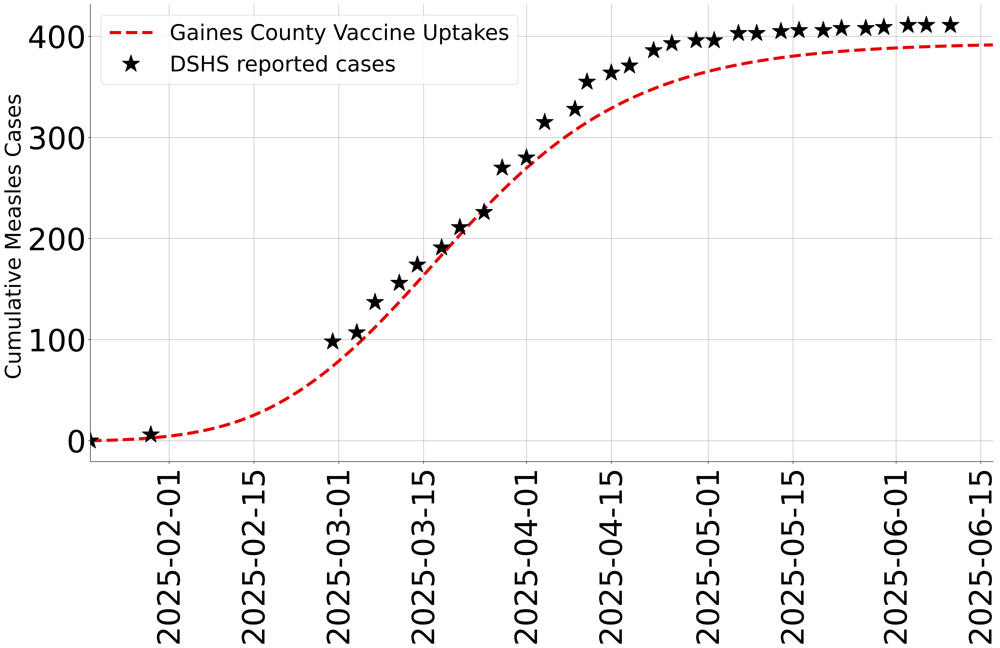

In [149]:
drange1 = pd.date_range("2025-01-19", periods=150, freq="1D")
fig = plt.figure(num=None, figsize=(24, 16), dpi=300, facecolor='w', edgecolor='k')
plt.rcParams.update({'font.size': 50})

plt.plot(drange1, cumcase, '--', color='xkcd:red', lw=5, label = 'Gaines County Vaccine Uptakes')


dates = pd.to_datetime(GC['Update Date']).dt.to_pydatetime()
plt.plot(dates, GC['Cumulative Cases'], '*', color='black', markersize=30, label = 'DSHS reported cases')

plt.xticks(rotation=90)
plt.ylabel('Cumulative Measles Cases ', fontsize = 35)
plt.legend(fontsize=35,loc='upper left');
plt.autoscale(enable=True, axis='x', tight=True)
plt.grid()
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False) #plt.title('High protection') #plt.axis([18970, 19285, 0, 1e6]) #plt.ylabel('reported deaths')
plt.tight_layout()

/var/folders/vy/m4l1bmcs7xd4nmd991yq7qkr0000gn/T/ipykernel_30104/2416072156.py:10: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  dates = pd.to_datetime(GC['Update Date']).dt.to_pydatetime()
/var/folders/vy/m4l1bmcs7xd4nmd991yq7qkr0000gn/T/ipykernel_30104/2416072156.py:13: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  dates = pd.to_datetime(GC['Update Date']).dt.to_pydatetime()
/var/folders/vy/m4l1bmcs7xd4nmd991yq7qkr0000gn/T/ipykernel_30104/2416072156.py:16: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python 

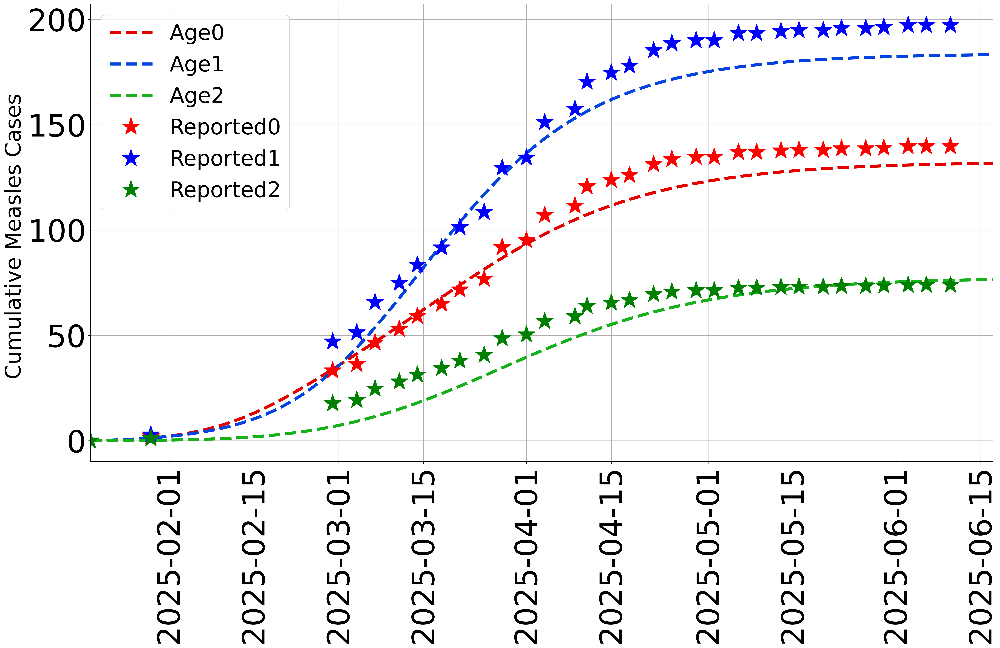

In [150]:
#only Gaines County Vaccine Uptakes by age groups
drange1 = pd.date_range("2025-01-19", periods=150, freq="1D")
fig = plt.figure(num=None, figsize=(24, 16), dpi=300, facecolor='w', edgecolor='k')
plt.rcParams.update({'font.size': 50})

plt.plot(drange1, cumcase0, '--', color='xkcd:red', lw=5, label = 'Age0')
plt.plot(drange1, cumcase1, '--', color='xkcd:blue', lw=5, label = 'Age1')
plt.plot(drange1, cumcase2, '--', color='xkcd:green', lw=5, label = 'Age2')

dates = pd.to_datetime(GC['Update Date']).dt.to_pydatetime()
plt.plot(dates, y_case0, '*', color='red', markersize=30, label = 'Reported0')

dates = pd.to_datetime(GC['Update Date']).dt.to_pydatetime()
plt.plot(dates, y_case1, '*', color='blue', markersize=30, label = 'Reported1')

dates = pd.to_datetime(GC['Update Date']).dt.to_pydatetime()
plt.plot(dates, y_case2, '*', color='green', markersize=30, label = 'Reported2')

plt.xticks(rotation=90)
plt.ylabel('Cumulative Measles Cases ', fontsize = 35)
plt.legend(fontsize=35,loc='upper left');
plt.autoscale(enable=True, axis='x', tight=True)
plt.grid()
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False) #plt.title('High protection') #plt.axis([18970, 19285, 0, 1e6]) #plt.ylabel('reported deaths')
plt.tight_layout()

In [13]:
def sim_sto(x, beta0, beta1, beta2, std0, std1, std2, V_input, con0, con1, con2):
    Nd = 145
    dt = 1
    N = [2341, 6500, 13682]
    V = V_input
    theta = 1.04

    mu = 0.891
    sigma = 0.0505
    a, b = (0 - mu) / sigma, (1 - mu) / sigma  # bounds for truncation
    rho = truncnorm.rvs(a, b, loc=mu, scale=sigma)

    S1 = np.zeros([3])
    S2 = np.zeros([3])
    V1 = np.zeros([3])
    V2 = np.zeros([3])
    E = np.zeros([3])
    I = np.zeros([3])
    R = np.zeros([3])
    H = np.zeros([3])
    D = np.zeros([3])

    S1_new = np.zeros([3])
    S2_new = np.zeros([3])
    E_new = np.zeros([3])
    I_new = np.zeros([3])
    R_new = np.zeros([3])
    H_new = np.zeros([3])
    D_new = np.zeros([3])
    V1_new = np.zeros([3])
    V2_new = np.zeros([3])

    case_count = 0
    hosp_count = 0
    death_count = 0
    case_count0 = 0
    hosp_count0 = 0
    death_count0 = 0
    case_count1 = 0
    hosp_count1 = 0
    death_count1 = 0
    case_count2 = 0
    hosp_count2 = 0
    death_count2 = 0

    cumcase = np.zeros([Nd])
    cumhosp = np.zeros([Nd])
    cumdeath = np.zeros([Nd])
    cumcase0 = np.zeros([Nd])
    cumhosp0 = np.zeros([Nd])
    cumdeath0 = np.zeros([Nd])
    cumcase1 = np.zeros([Nd])
    cumhosp1 = np.zeros([Nd])
    cumdeath1 = np.zeros([Nd])
    cumcase2 = np.zeros([Nd])
    cumhosp2 = np.zeros([Nd])
    cumdeath2 = np.zeros([Nd])
    cumI = np.zeros([Nd])
    cumH = np.zeros([Nd])
    cumD = np.zeros([Nd])

    x_contact = [con0, con1, con2]

    for n in range(3):
        contact_rate = x_contact[n]
        S_total = N[n] - V[n]
        S1[n] = S_total * contact_rate
        S2[n] = S_total * (1 - contact_rate)
        v_total = V[n]
        V1[n] = v_total * contact_rate
        V2[n] = v_total * (1 - contact_rate)

    I[1] = 1

    for tt in range(int(Nd / dt)):
        #np.random.seed()
        sig = np.random.uniform(sigma_lb, sigma_ub)
        gam1 = np.random.uniform(gamma1_lb, gamma1_ub)
        gam2 = np.random.uniform(gamma2_lb, gamma2_ub)
        IHR = [np.random.uniform(IHR_lb[0], IHR_ub[0]),
               np.random.uniform(IHR_lb[1], IHR_ub[1]),
               np.random.uniform(IHR_lb[2], IHR_ub[2])]
        HDR = [np.random.uniform(HDR_lb[0], HDR_ub[0]),
               np.random.uniform(HDR_lb[1], HDR_ub[1]),
               np.random.uniform(HDR_lb[2], HDR_ub[2])]

        for i in range(3):
            if i == 0:
                rnd = np.random.normal(0, std0, 1)
                beta = np.clip(beta0 + 2 * rnd, 0, 5)
                eps = epsilon[0]
                ihr = IHR[0]
                hdr = HDR[0]
                the = theta
            elif i == 1:
                rnd = np.random.normal(0, std1, 1)
                beta = np.clip(beta1 + 2 * rnd, 0, 5)
                eps = epsilon[1]
                ihr = IHR[1]
                hdr = HDR[1]
                the = 0
            elif i == 2:
                rnd = np.random.normal(0, std2, 1)
                beta = np.clip(beta2 + 2 * rnd, 0, 5)
                eps = epsilon[2]
                ihr = IHR[2]
                hdr = HDR[2]
                the = 0

            N_dyn = S1 + E + I + R + H + D + V1
            foi = beta * computerate(i, CM, 1, I, N_dyn)

            S1_new[i] = max(0,S1[i] - foi * S1[i] - the*x_contact[i])
            S2_new[i] = S2[i] - the*(1-x_contact[i])# no contact
            V1_new[i] = V1[i] - foi * V1[i] * (1 - eps) + the*x_contact[i]
            V2_new[i] = V2[i] + the*(1-x_contact[i]) # static if no movement

            E_new[i] = E[i] + foi * S1[i] + foi * V1[i] * (1 - eps) - sig * E[i]
            I_new[i] = I[i] + sig * E[i] - (ihr + gam1) * I[i]
            case_count=case_count+sig * E[i] * rho
            cumcase[tt] = case_count

            H_new[i] = H[i] + ihr * I[i] - (hdr + gam2) * H[i]
            hosp_count=hosp_count+ihr * I[i] * rho
            cumhosp[tt] = hosp_count

            R_new[i] = R[i] + gam1 * I[i] + gam2 * H[i]
            D_new[i] = D[i] + hdr * H[i]
            death_count=death_count+hdr * H[i] * rho
            cumdeath[tt] = death_count

            if i == 0:
                case_count0 = case_count0+sig * E[i] * rho
                cumcase0[tt] = case_count0
                hosp_count0 = hosp_count0+ihr * I[i] * rho
                cumhosp0[tt] = hosp_count0
                death_count0 = death_count0+hdr * H[i] * rho
                cumdeath0[tt] = death_count0
            elif i == 1:
                case_count1 = case_count1+sig * E[i] * rho
                cumcase1[tt] = case_count1
                hosp_count1 = hosp_count1+ihr * I[i] * rho
                cumhosp1[tt] = hosp_count1
                death_count1 = death_count1+hdr * H[i] * rho
                cumdeath1[tt] = death_count1
            elif i == 2:
                case_count2 = case_count2+sig * E[i] * rho
                cumcase2[tt] = case_count2
                hosp_count2 = hosp_count2+ihr * I[i] * rho
                cumhosp2[tt] = hosp_count2
                death_count2 = death_count2+hdr * H[i] * rho
                cumdeath2[tt] = death_count2

        S1 = S1_new
        S2 = S2_new
        V1 = V1_new
        V2 = V2_new
        E = E_new
        I = I_new
        H = H_new
        R = R_new
        D = D_new

        cumI[tt] = np.sum(I)
        cumH[tt] = np.sum(H)
        cumD[tt] = np.sum(D)

    t_subset = GC['t'].iloc[1:32].values
    case_series = cumcase[t_subset]

    p0 = 100 * sum(cumcase0) / sum(cumcase)
    p1 = 100 * sum(cumcase1) / sum(cumcase)
    p2 = 100 * sum(cumcase2) / sum(cumcase)

    fit_case = np.concatenate((case_series, [p0, p1, p2]))

    return fit_case, cumI, cumH, cumD, cumcase, cumhosp, cumdeath, cumcase0, cumhosp0, cumcase1, cumhosp1, cumcase2, cumhosp2


In [14]:
def sim_scenario(V_sce):
    Nsim = 200
    Nd = 145

    x1, x2, x3 = popt[0], popt[1], popt[2]
    y1, y2, y3= popt[3],popt[4],popt[5]
    z1, z2, z3 = pcov[0][0], pcov[1][1], pcov[2][2]

    new_Inf = np.zeros([Nd, Nsim])
    new_Hosp = np.zeros([Nd, Nsim])
    new_Death = np.zeros([Nd, Nsim])
    cum_Inf = np.zeros([Nd, Nsim])
    cum_Hosp = np.zeros([Nd, Nsim])
    cum_Death = np.zeros([Nd, Nsim])
    cum_Inf0 = np.zeros([Nd, Nsim])
    cum_Inf1 = np.zeros([Nd, Nsim])
    cum_Inf2 = np.zeros([Nd, Nsim])
    cum_Hosp0 = np.zeros([Nd, Nsim])
    cum_Hosp1 = np.zeros([Nd, Nsim])
    cum_Hosp2 = np.zeros([Nd, Nsim])

    for i in range(Nsim):
        fit_case, cumI, cumH, cumD, cumcase, cumhosp, cumdeath, cumcase0, cumhosp0, cumcase1, cumhosp1, cumcase2, cumhosp2 = sim_sto(
            0, x1, x2, x3, z1, z2, z3, V_sce, y1, y2, y3)
        new_Inf[:, i] = cumI
        new_Hosp[:, i] = cumH
        new_Death[:, i] = cumD
        cum_Inf[:, i] = cumcase
        cum_Hosp[:, i] = cumhosp
        cum_Death[:, i] = cumdeath
        cum_Inf0[:, i] = cumcase0
        cum_Inf1[:, i] = cumcase1
        cum_Inf2[:, i] = cumcase2
        cum_Hosp0[:, i] = cumhosp0
        cum_Hosp1[:, i] = cumhosp1
        cum_Hosp2[:, i] = cumhosp2

    # Same percentile calculations
    percentiles = [0, 1, 2.5, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50,
                   55, 60, 65, 70, 75, 80, 85, 90, 95, 97.5, 99, 100]
    new_Inf_p = np.percentile(new_Inf, percentiles, axis=1).T
    new_Hosp_p = np.percentile(new_Hosp, percentiles, axis=1).T
    new_Death_p = np.percentile(new_Death, percentiles, axis=1).T
    cum_Inf_p = np.percentile(cum_Inf, percentiles, axis=1).T
    cum_Hosp_p = np.percentile(cum_Hosp, percentiles, axis=1).T
    cum_Death_p = np.percentile(cum_Death, percentiles, axis=1).T
    cum_Inf0_p = np.percentile(cum_Inf0, percentiles, axis=1).T
    cum_Inf1_p = np.percentile(cum_Inf1, percentiles, axis=1).T
    cum_Inf2_p = np.percentile(cum_Inf2, percentiles, axis=1).T
    cum_Hosp0_p = np.percentile(cum_Hosp0, percentiles, axis=1).T
    cum_Hosp1_p = np.percentile(cum_Hosp1, percentiles, axis=1).T
    cum_Hosp2_p = np.percentile(cum_Hosp2, percentiles, axis=1).T

    return (new_Inf_p, new_Hosp_p, new_Death_p,
            cum_Inf,cum_Inf_p, cum_Hosp_p, cum_Death_p, 
            cum_Inf0_p, cum_Inf1_p, cum_Inf2_p,
            cum_Hosp0_p, cum_Hosp1_p, cum_Hosp2_p)


In [17]:
new_Inf_p_A, new_Hosp_p_A, new_Death_p_A, cum_Inf_A, cum_Inf_p_A, cum_Hosp_p_A, cum_Death_p_A,cum_Inf0_p_A,cum_Inf1_p_A,cum_Inf2_p_A,cum_Hosp0_p_A,cum_Hosp1_p_A,cum_Hosp2_p_A=sim_scenario(V_base)
new_Inf_p_B, new_Hosp_p_B, new_Death_p_B, cum_Inf_B, cum_Inf_p_B, cum_Hosp_p_B, cum_Death_p_B,cum_Inf0_p_B,cum_Inf1_p_B,cum_Inf2_p_B,cum_Hosp0_p_B,cum_Hosp1_p_B,cum_Hosp2_p_B=sim_scenario(V_low)
new_Inf_p_C, new_Hosp_p_C, new_Death_p_C, cum_Inf_C, cum_Inf_p_C, cum_Hosp_p_C, cum_Death_p_C,cum_Inf0_p_C,cum_Inf1_p_C,cum_Inf2_p_C,cum_Hosp0_p_C,cum_Hosp1_p_C,cum_Hosp2_p_C=sim_scenario(V_high)

/var/folders/vy/m4l1bmcs7xd4nmd991yq7qkr0000gn/T/ipykernel_68482/2078779323.py:113: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  S1_new[i] = max(0,S1[i] - foi * S1[i] - the*x_contact[i])
/var/folders/vy/m4l1bmcs7xd4nmd991yq7qkr0000gn/T/ipykernel_68482/2078779323.py:115: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  V1_new[i] = V1[i] - foi * V1[i] * (1 - eps) + the*x_contact[i]
/var/folders/vy/m4l1bmcs7xd4nmd991yq7qkr0000gn/T/ipykernel_68482/2078779323.py:118: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing t

/var/folders/vy/m4l1bmcs7xd4nmd991yq7qkr0000gn/T/ipykernel_30104/1492812960.py:13: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  dates = pd.to_datetime(GC['Update Date']).dt.to_pydatetime()


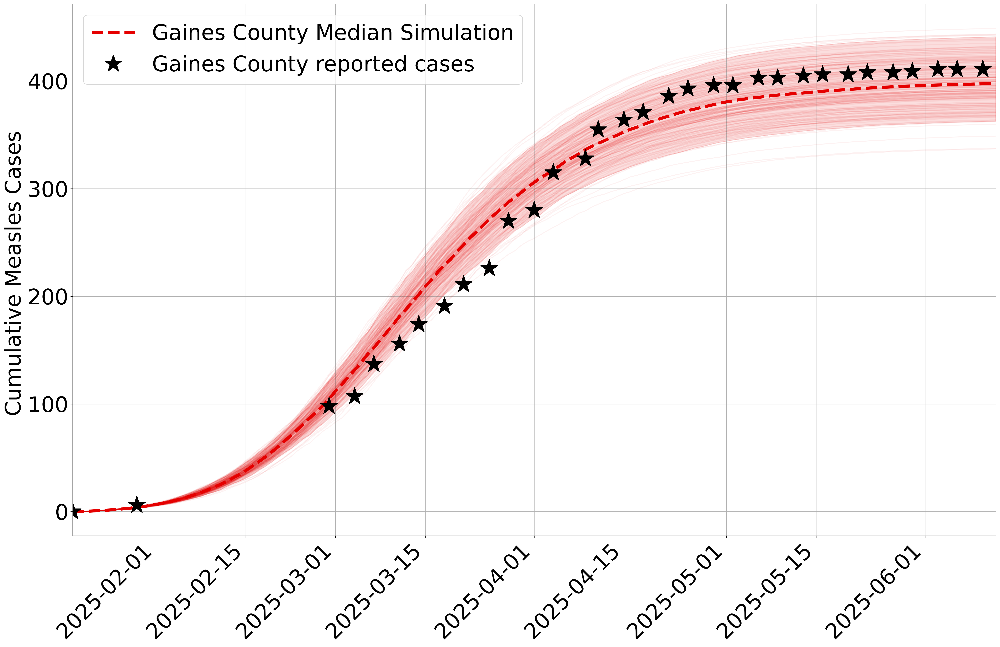

In [206]:
# all 200 trajectories
drange1 = pd.date_range("2025-01-19", periods=145, freq="1D")
fig = plt.figure(num=None, figsize=(24, 16), dpi=300, facecolor='w', edgecolor='k')
plt.rcParams.update({'font.size': 50})

# Plot 200 simulation trajectories (thin, light red lines)
for i in range(cum_Inf_A.shape[1]):  # assuming shape is (145, 200)
    plt.plot(drange1, cum_Inf_A[:, i], color='xkcd:red', alpha=0.05, linewidth=1.5)
    
plt.fill_between(drange1, cum_Inf_p_A[:,2], cum_Inf_p_A[:,22], color='xkcd:red', alpha=0.13)
plt.plot(drange1, cum_Inf_p_A[:,12], '--', color='xkcd:red', lw=5, label = 'Gaines County Median Simulation')

dates = pd.to_datetime(GC['Update Date']).dt.to_pydatetime()
plt.plot(dates, GC['Cumulative Cases'], '*', color='black', markersize=30, label = 'Gaines County reported cases')

plt.xticks(rotation=90)
plt.tick_params(axis='both', labelsize=35)
plt.ylabel('Cumulative Measles Cases ', fontsize = 35)
plt.setp(plt.gca().xaxis.get_majorticklabels(), rotation=45, ha="right")
plt.legend(fontsize=35,loc='upper left');
plt.autoscale(enable=True, axis='x', tight=True)
plt.grid()
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False) #plt.title('High protection') #plt.axis([18970, 19285, 0, 1e6]) #plt.ylabel('reported deaths')
plt.tight_layout()

# Save the figure
output_path = os.path.join(FIGURE_DIR, "case_200.png")
plt.savefig(output_path, dpi=300, bbox_inches='tight')

/var/folders/vy/m4l1bmcs7xd4nmd991yq7qkr0000gn/T/ipykernel_30104/1503811957.py:14: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  dates = pd.to_datetime(GC['Update Date']).dt.to_pydatetime()


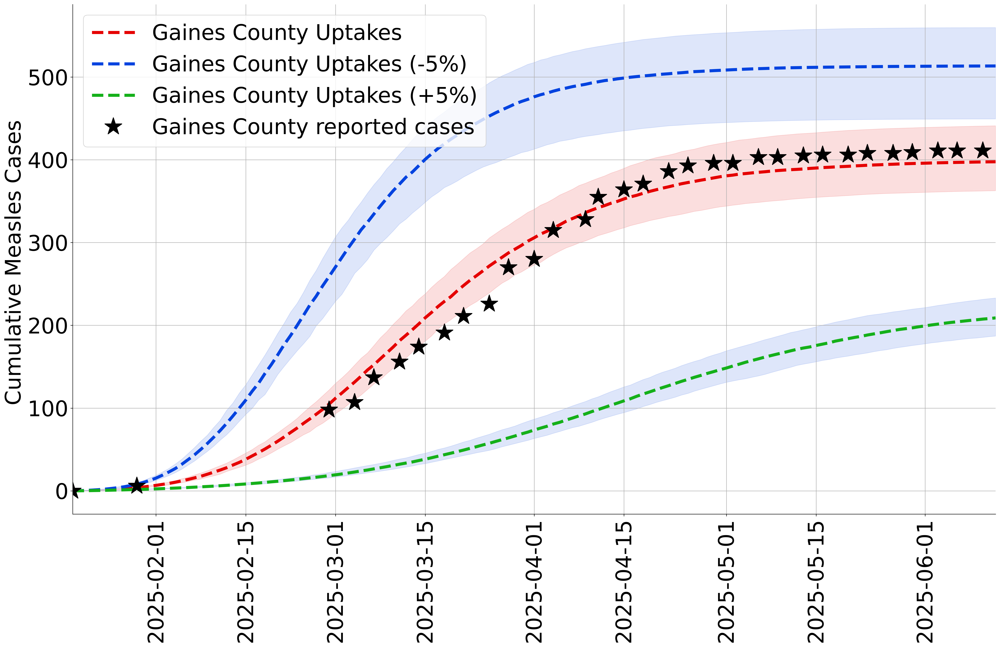

In [203]:
drange1 = pd.date_range("2025-01-19", periods=145, freq="1D")
fig = plt.figure(num=None, figsize=(24, 16), dpi=300, facecolor='w', edgecolor='k')
plt.rcParams.update({'font.size': 50})

plt.fill_between(drange1, cum_Inf_p_A[:,2], cum_Inf_p_A[:,22], color='xkcd:red', alpha=0.13)
plt.plot(drange1, cum_Inf_p_A[:,12], '--', color='xkcd:red', lw=5, label = 'Gaines County Uptakes')

plt.fill_between(drange1, cum_Inf_p_B[:,2], cum_Inf_p_B[:,22], color='xkcd:blue', alpha=0.13)
plt.plot(drange1, cum_Inf_p_B[:,12], '--', color='xkcd:blue', lw=5, label = 'Gaines County Uptakes (-5%)')

plt.fill_between(drange1, cum_Inf_p_C[:,2], cum_Inf_p_C[:,22], color='xkcd:blue', alpha=0.13)
plt.plot(drange1, cum_Inf_p_C[:,12], '--', color='xkcd:green', lw=5, label = 'Gaines County Uptakes (+5%)')

dates = pd.to_datetime(GC['Update Date']).dt.to_pydatetime()
plt.plot(dates, GC['Cumulative Cases'], '*', color='black', markersize=30, label = 'Gaines County reported cases')

plt.xticks(rotation=90)
plt.tick_params(axis='both', labelsize=35)
plt.ylabel('Cumulative Measles Cases ', fontsize = 35)
plt.legend(fontsize=35,loc='upper left');
plt.autoscale(enable=True, axis='x', tight=True)
plt.grid()
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False) #plt.title('High protection') #plt.axis([18970, 19285, 0, 1e6]) #plt.ylabel('reported deaths')
plt.tight_layout()


/var/folders/vy/m4l1bmcs7xd4nmd991yq7qkr0000gn/T/ipykernel_30104/3085645018.py:27: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  dates = pd.to_datetime(GC['Update Date']).dt.to_pydatetime()


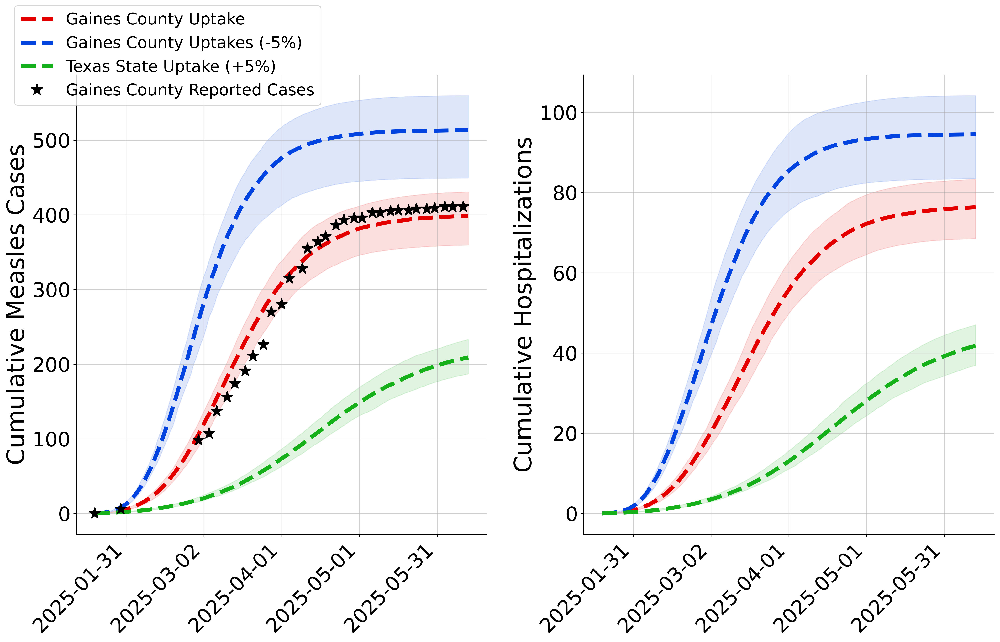

In [187]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

# Define the 1x2 subplot layout
fig, axs = plt.subplots(1, 2, figsize=(18,12), dpi=300, facecolor='w', edgecolor='k')

# Global font settings
plt.rcParams.update({'font.size': 30})  # Consistent large font for readability

# Define date range
drange1 = pd.date_range("2025-01-19", periods=145, freq="1D")

# --- First subplot: Cumulative Cases ---
ax = axs[0]

ax.fill_between(drange1, cum_Inf_p_A[:, 2], cum_Inf_p_A[:, 22], color='xkcd:red', alpha=0.13)
ax.plot(drange1, cum_Inf_p_A[:, 12], '--', color='xkcd:red', lw=5, label='Gaines County Uptake')

ax.fill_between(drange1, cum_Inf_p_B[:, 2], cum_Inf_p_B[:, 22], color='xkcd:blue', alpha=0.13)
ax.plot(drange1, cum_Inf_p_B[:, 12], '--', color='xkcd:blue', lw=5, label='Gaines County Uptakes (-5%)')

ax.fill_between(drange1, cum_Inf_p_C[:, 2], cum_Inf_p_C[:, 22], color='xkcd:green', alpha=0.13)
ax.plot(drange1, cum_Inf_p_C[:, 12], '--', color='xkcd:green', lw=5, label='Texas State Uptake (+5%)')

# Reported cases as black stars
dates = pd.to_datetime(GC['Update Date']).dt.to_pydatetime()
ax.plot(dates, GC['Cumulative Cases'], '*', color='black', markersize=15, label='Gaines County Reported Cases')

# Format x-axis
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
ax.xaxis.set_major_locator(mdates.DayLocator(interval=30))  # Show every 15th day
plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha="right")  # Rotate for readability

ax.set_ylabel('Cumulative Measles Cases', fontsize=30)
ax.tick_params(axis='both', labelsize=25)
ax.legend(fontsize=20, loc='upper left', bbox_to_anchor=(-0.15, 1.15), borderaxespad=0.)
ax.grid(alpha=0.6)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# --- Second subplot: Cumulative Hospitalizations ---
ax1 = axs[1]

ax1.fill_between(drange1, cum_Hosp_p_A[:, 2], cum_Hosp_p_A[:, 22], color='xkcd:red', alpha=0.13)
ax1.plot(drange1, cum_Hosp_p_A[:, 12], '--', color='xkcd:red', lw=5, label='Gaines County Vaccine Uptakes')

ax1.fill_between(drange1, cum_Hosp_p_B[:, 2], cum_Hosp_p_B[:, 22], color='xkcd:blue', alpha=0.13)
ax1.plot(drange1, cum_Hosp_p_B[:, 12], '--', color='xkcd:blue', lw=5, label='Gaines County Vaccine Uptakes (-5%)')

ax1.fill_between(drange1, cum_Hosp_p_C[:, 2], cum_Hosp_p_C[:, 22], color='xkcd:green', alpha=0.13)
ax1.plot(drange1, cum_Hosp_p_C[:, 12], '--', color='xkcd:green', lw=5, label='Texas State Vaccine Uptakes (+5%)')

# Format x-axis
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
ax1.xaxis.set_major_locator(mdates.DayLocator(interval=30))  # Show every 15th day
plt.setp(ax1.xaxis.get_majorticklabels(), rotation=45, ha="right")  # Rotate for readability

ax1.set_ylabel('Cumulative Hospitalizations', fontsize=30)
ax1.tick_params(axis='both', labelsize=25)
#ax1.legend(fontsize=24, loc='upper left')
ax1.grid(alpha=0.6)

ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

plt.tight_layout()

# Save the figure
output_path = os.path.join(FIGURE_DIR, "case.png")
plt.savefig(output_path, dpi=300, bbox_inches='tight')

plt.show()

/var/folders/vy/m4l1bmcs7xd4nmd991yq7qkr0000gn/T/ipykernel_30104/1202243958.py:15: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  dates = pd.to_datetime(GC['Update Date']).dt.to_pydatetime()
/var/folders/vy/m4l1bmcs7xd4nmd991yq7qkr0000gn/T/ipykernel_30104/1202243958.py:18: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  dates = pd.to_datetime(GC['Update Date']).dt.to_pydatetime()
/var/folders/vy/m4l1bmcs7xd4nmd991yq7qkr0000gn/T/ipykernel_30104/1202243958.py:21: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python 

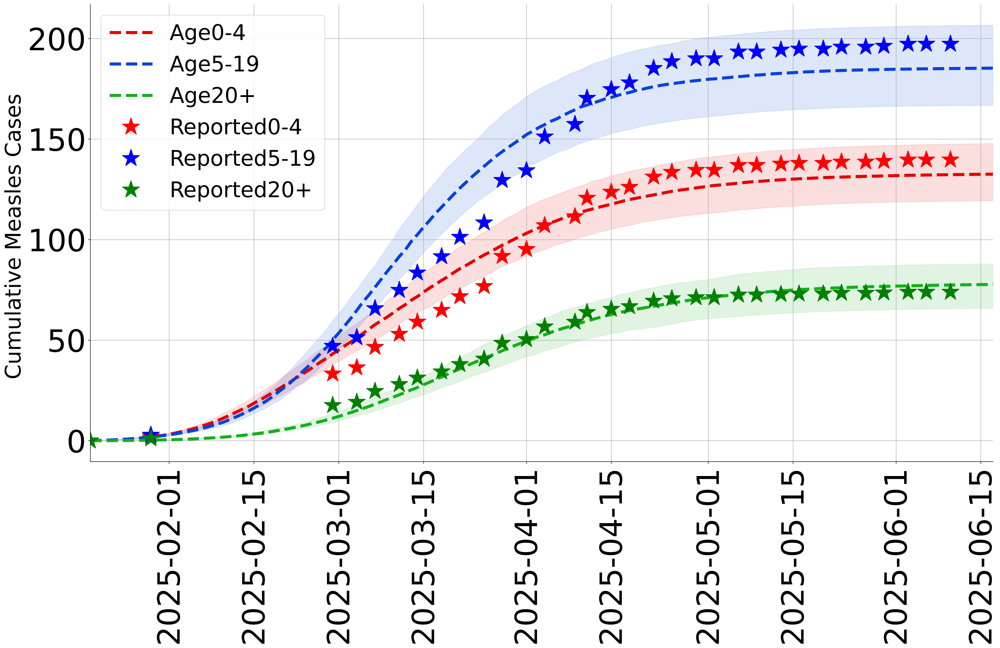

In [156]:
#only Gaines County Vaccine Uptakes by age groups
drange1 = pd.date_range("2025-01-19", periods=150, freq="1D")
fig = plt.figure(num=None, figsize=(24, 16), dpi=300, facecolor='w', edgecolor='k')
plt.rcParams.update({'font.size': 50})

plt.fill_between(drange1, cum_Inf0_p_A[:,2], cum_Inf0_p_A[:,22], color='xkcd:red', alpha=0.13)
plt.plot(drange1, cum_Inf0_p_A[:,12], '--', color='xkcd:red', lw=5, label = 'Age0-4')

plt.fill_between(drange1, cum_Inf1_p_A[:,2], cum_Inf1_p_A[:,22], color='xkcd:blue', alpha=0.13)
plt.plot(drange1, cum_Inf1_p_A[:,12], '--', color='xkcd:blue', lw=5, label = 'Age5-19')

plt.fill_between(drange1, cum_Inf2_p_A[:,2], cum_Inf2_p_A[:,22], color='xkcd:green', alpha=0.13)
plt.plot(drange1, cum_Inf2_p_A[:,12], '--', color='xkcd:green', lw=5, label = 'Age20+')

dates = pd.to_datetime(GC['Update Date']).dt.to_pydatetime()
plt.plot(dates, y_case0, '*', color='red', markersize=30, label = 'Reported0-4')

dates = pd.to_datetime(GC['Update Date']).dt.to_pydatetime()
plt.plot(dates, y_case1, '*', color='blue', markersize=30, label = 'Reported5-19')

dates = pd.to_datetime(GC['Update Date']).dt.to_pydatetime()
plt.plot(dates, y_case2, '*', color='green', markersize=30, label = 'Reported20+')

plt.xticks(rotation=90)
plt.ylabel('Cumulative Measles Cases ', fontsize = 35)
plt.legend(fontsize=35,loc='upper left');
plt.autoscale(enable=True, axis='x', tight=True)
plt.grid()
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False) #plt.title('High protection') #plt.axis([18970, 19285, 0, 1e6]) #plt.ylabel('reported deaths')
plt.tight_layout()

/var/folders/vy/m4l1bmcs7xd4nmd991yq7qkr0000gn/T/ipykernel_30104/2807511482.py:23: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  dates = pd.to_datetime(GC['Update Date']).dt.to_pydatetime()


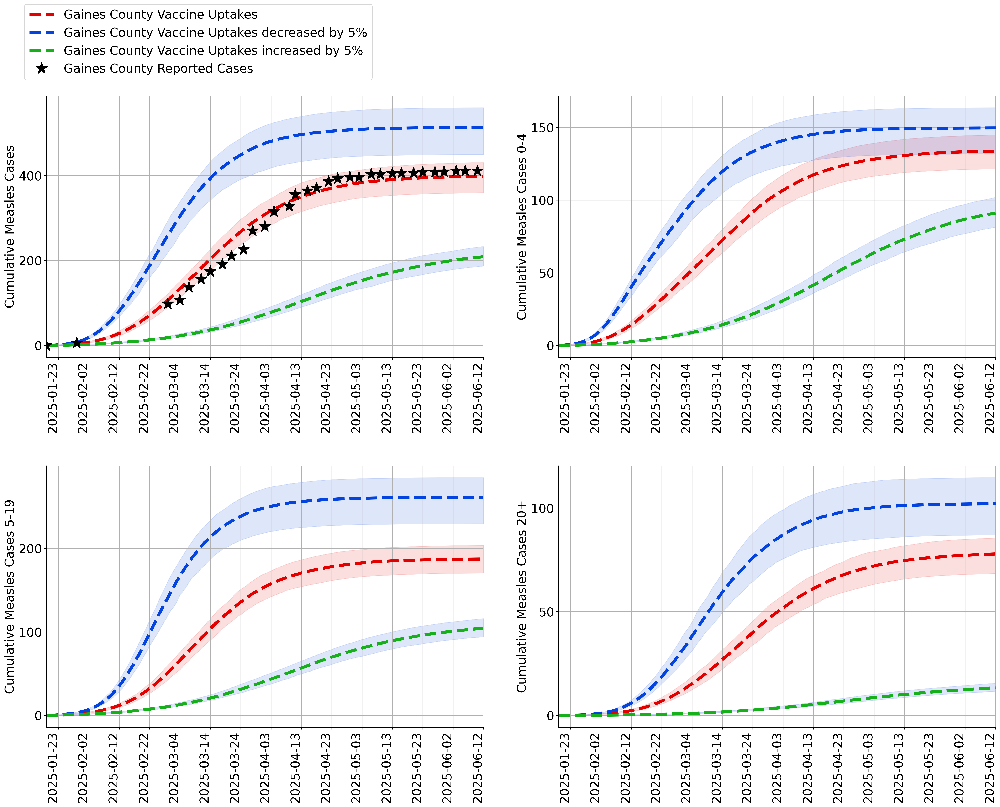

In [189]:
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.dates as mdates

# Define the 2x2 subplot layout
fig, axs = plt.subplots(2, 2, figsize=(24, 20), dpi=300, facecolor='w', edgecolor='k')
plt.rcParams.update({'font.size': 50})  # Keep font size consistent

# First subplot (Top-Left: Your current plot)
ax = axs[0, 0]

drange1 = pd.date_range("2025-01-19", periods=145, freq="1D")

ax.fill_between(drange1, cum_Inf_p_A[:, 2], cum_Inf_p_A[:, 22], color='xkcd:red', alpha=0.13)
ax.plot(drange1, cum_Inf_p_A[:, 12], '--', color='xkcd:red', lw=5, label='Gaines County Vaccine Uptakes')

ax.fill_between(drange1, cum_Inf_p_B[:, 2], cum_Inf_p_B[:, 22], color='xkcd:blue', alpha=0.13)
ax.plot(drange1, cum_Inf_p_B[:, 12], '--', color='xkcd:blue', lw=5, label='Gaines County Vaccine Uptakes decreased by 5%')

ax.fill_between(drange1, cum_Inf_p_C[:,2], cum_Inf_p_C[:,22], color='xkcd:blue', alpha=0.13)
ax.plot(drange1, cum_Inf_p_C[:,12], '--', color='xkcd:green', lw=5, label = 'Gaines County Vaccine Uptakes increased by 5%')

dates = pd.to_datetime(GC['Update Date']).dt.to_pydatetime()
ax.plot(dates, GC['Cumulative Cases'], '*', color='black', markersize=20, label='Gaines County Reported Cases')

# Format x-axis to only show date
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))  # Show only date
ax.xaxis.set_major_locator(mdates.DayLocator(interval=10))  # Show every 5th day (adjustable)
plt.setp(ax.xaxis.get_majorticklabels(), fontsize=20, rotation=90, ha="right")  # Rotate for readability
plt.setp(ax.yaxis.get_majorticklabels(), fontsize=20) 

ax.set_ylabel('Cumulative Measles Cases', fontsize=20)
#ax.legend(fontsize=20, loc='upper left')
ax.legend(fontsize=20, loc='upper left', bbox_to_anchor=(-0.05, 1.35), borderaxespad=0.)
ax.autoscale(enable=True, axis='x', tight=True)
ax.grid()

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax1 = axs[0, 1]

ax1.fill_between(drange1, cum_Inf0_p_A[:, 2], cum_Inf0_p_A[:, 22], color='xkcd:red', alpha=0.13)
ax1.plot(drange1, cum_Inf0_p_A[:, 12], '--', color='xkcd:red', lw=5, label='Baseline Vaccine Uptake')

ax1.fill_between(drange1, cum_Inf0_p_B[:, 2], cum_Inf0_p_B[:, 22], color='xkcd:blue', alpha=0.13)
ax1.plot(drange1, cum_Inf0_p_B[:, 12], '--', color='xkcd:blue', lw=5, label='Annual Vaccine Uptake Reduced by 15%')

ax1.fill_between(drange1, cum_Inf0_p_C[:,2], cum_Inf0_p_C[:,22], color='xkcd:blue', alpha=0.13)
ax1.plot(drange1, cum_Inf0_p_C[:,12], '--', color='xkcd:green', lw=5, label = 'Average vaccine uptake across Texas')

# Format x-axis to only show date
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))  # Show only date
ax1.xaxis.set_major_locator(mdates.DayLocator(interval=10))  # Show every 5th day (adjustable)
plt.setp(ax1.xaxis.get_majorticklabels(), fontsize=20, rotation=90, ha="right")  # Rotate for readability
plt.setp(ax1.yaxis.get_majorticklabels(), fontsize=20) 

ax1.set_ylabel('Cumulative Measles Cases 0-4', fontsize=20)
ax1.autoscale(enable=True, axis='x', tight=True)
ax1.grid()

ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

ax2 = axs[1, 0]

ax2.fill_between(drange1, cum_Inf1_p_A[:, 2], cum_Inf1_p_A[:, 22], color='xkcd:red', alpha=0.13)
ax2.plot(drange1, cum_Inf1_p_A[:, 12], '--', color='xkcd:red', lw=5, label='Baseline Vaccine Uptake')

ax2.fill_between(drange1, cum_Inf1_p_B[:, 2], cum_Inf1_p_B[:, 22], color='xkcd:blue', alpha=0.13)
ax2.plot(drange1, cum_Inf1_p_B[:, 12], '--', color='xkcd:blue', lw=5, label='Annual Vaccine Uptake Reduced by 5%')

ax2.fill_between(drange1, cum_Inf1_p_C[:,2], cum_Inf1_p_C[:,22], color='xkcd:blue', alpha=0.13)
ax2.plot(drange1, cum_Inf1_p_C[:,12], '--', color='xkcd:green', lw=5, label = 'Average vaccine uptake across Texas')

# Format x-axis to only show date
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))  # Show only date
ax2.xaxis.set_major_locator(mdates.DayLocator(interval=10))  # Show every 5th day (adjustable)
plt.setp(ax2.xaxis.get_majorticklabels(), fontsize=20, rotation=90, ha="right")  # Rotate for readability
plt.setp(ax2.yaxis.get_majorticklabels(), fontsize=20) 

ax2.set_ylabel('Cumulative Measles Cases 5-19', fontsize=20)
ax2.autoscale(enable=True, axis='x', tight=True)
ax2.grid()

ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

ax3 = axs[1, 1]

ax3.fill_between(drange1, cum_Inf2_p_A[:, 2], cum_Inf2_p_A[:, 22], color='xkcd:red', alpha=0.13)
ax3.plot(drange1, cum_Inf2_p_A[:, 12], '--', color='xkcd:red', lw=5, label='Baseline Vaccine Uptake')

ax3.fill_between(drange1, cum_Inf2_p_B[:, 2], cum_Inf2_p_B[:, 22], color='xkcd:blue', alpha=0.13)
ax3.plot(drange1, cum_Inf2_p_B[:, 12], '--', color='xkcd:blue', lw=5, label='Annual Vaccine Uptake Reduced by 15%')

ax3.fill_between(drange1, cum_Inf2_p_C[:,2], cum_Inf2_p_C[:,22], color='xkcd:blue', alpha=0.13)
ax3.plot(drange1, cum_Inf2_p_C[:,12], '--', color='xkcd:green', lw=5, label = 'Average vaccine uptake across Texas')

# Format x-axis to only show date
ax3.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))  # Show only date
ax3.xaxis.set_major_locator(mdates.DayLocator(interval=10))  # Show every 5th day (adjustable)
plt.setp(ax3.xaxis.get_majorticklabels(), fontsize=20, rotation=90, ha="right")  # Rotate for readability
plt.setp(ax3.yaxis.get_majorticklabels(), fontsize=20) 

ax3.set_ylabel('Cumulative Measles Cases 20+', fontsize=20)
ax3.autoscale(enable=True, axis='x', tight=True)
ax3.grid()

ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)

# Adjust layout for better spacing
plt.tight_layout()

# Save the figure
output_path = os.path.join(FIGURE_DIR, "case_age.png")
plt.savefig(output_path, dpi=300, bbox_inches='tight')

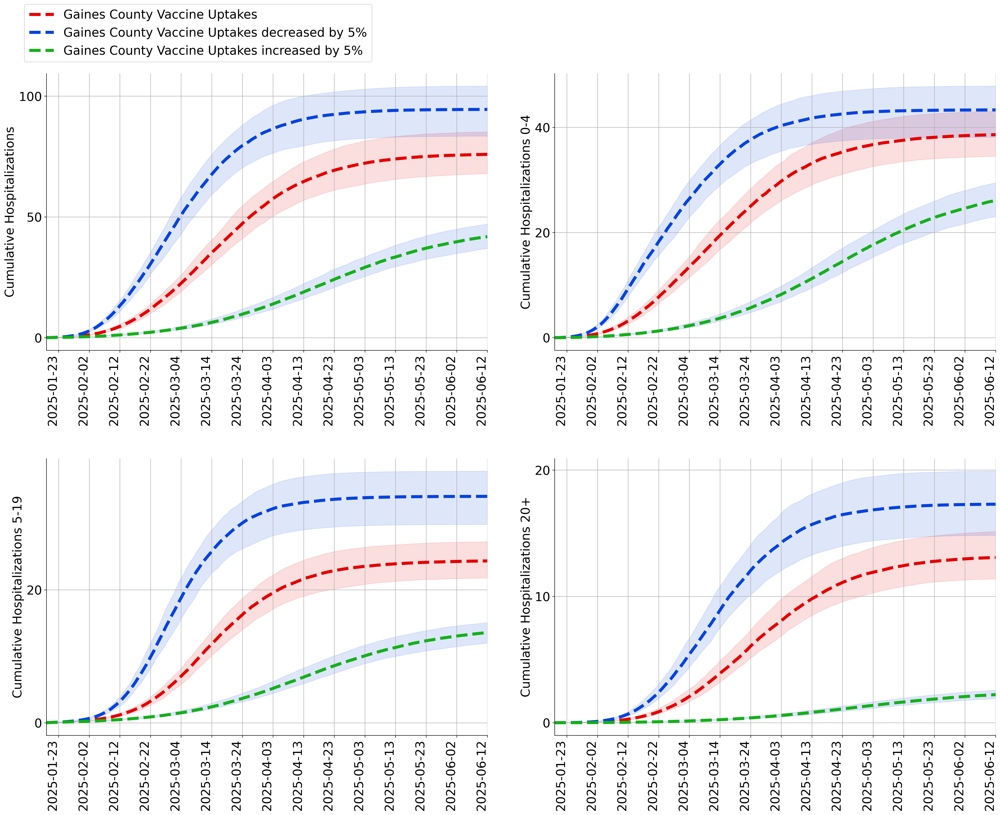

In [211]:
# Define the 2x2 subplot layout
fig, axs = plt.subplots(2, 2, figsize=(24, 20), dpi=300, facecolor='w', edgecolor='k')
plt.rcParams.update({'font.size': 50})  # Keep font size consistent

# First subplot (Top-Left: Your current plot)
ax = axs[0, 0]

drange1 = pd.date_range("2025-01-19", periods=145, freq="1D")

ax.fill_between(drange1, cum_Hosp_p_A[:, 2], cum_Hosp_p_A[:, 22], color='xkcd:red', alpha=0.13)
ax.plot(drange1, cum_Hosp_p_A[:, 12], '--', color='xkcd:red', lw=5, label='Gaines County Vaccine Uptakes')

ax.fill_between(drange1, cum_Hosp_p_B[:, 2], cum_Hosp_p_B[:, 22], color='xkcd:blue', alpha=0.13)
ax.plot(drange1, cum_Hosp_p_B[:, 12], '--', color='xkcd:blue', lw=5, label='Gaines County Vaccine Uptakes decreased by 5%')

ax.fill_between(drange1, cum_Hosp_p_C[:,2], cum_Hosp_p_C[:,22], color='xkcd:blue', alpha=0.13)
ax.plot(drange1, cum_Hosp_p_C[:,12], '--', color='xkcd:green', lw=5, label = 'Gaines County Vaccine Uptakes increased by 5%')

#dates = pd.to_datetime(GC['Update Date']).dt.to_pydatetime()
#ax.plot(dates, GC['Cumulative Cases'], '*', color='black', markersize=20, label='Gaines County Reported Cases')

# Format x-axis to only show date
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))  # Show only date
ax.xaxis.set_major_locator(mdates.DayLocator(interval=10))  # Show every 5th day (adjustable)
plt.setp(ax.xaxis.get_majorticklabels(), fontsize=20, rotation=90, ha="right")  # Rotate for readability
plt.setp(ax.yaxis.get_majorticklabels(), fontsize=20) 

ax.set_ylabel('Cumulative Hospitalizations', fontsize=20)
#ax.legend(fontsize=20, loc='upper left')
ax.legend(fontsize=20, loc='upper left', bbox_to_anchor=(-0.05, 1.25), borderaxespad=0.)
ax.autoscale(enable=True, axis='x', tight=True)
ax.grid()

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax1 = axs[0, 1]

ax1.fill_between(drange1, cum_Hosp0_p_A[:, 2], cum_Hosp0_p_A[:, 22], color='xkcd:red', alpha=0.13)
ax1.plot(drange1, cum_Hosp0_p_A[:, 12], '--', color='xkcd:red', lw=5, label='Baseline Vaccine Uptake')

ax1.fill_between(drange1, cum_Hosp0_p_B[:, 2], cum_Hosp0_p_B[:, 22], color='xkcd:blue', alpha=0.13)
ax1.plot(drange1, cum_Hosp0_p_B[:, 12], '--', color='xkcd:blue', lw=5, label='Annual Vaccine Uptake Reduced by 15%')

ax1.fill_between(drange1, cum_Hosp0_p_C[:,2], cum_Hosp0_p_C[:,22], color='xkcd:blue', alpha=0.13)
ax1.plot(drange1, cum_Hosp0_p_C[:,12], '--', color='xkcd:green', lw=5, label = 'Average vaccine uptake across Texas')

# Format x-axis to only show date
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))  # Show only date
ax1.xaxis.set_major_locator(mdates.DayLocator(interval=10))  # Show every 5th day (adjustable)
plt.setp(ax1.xaxis.get_majorticklabels(), fontsize=20, rotation=90, ha="right")  # Rotate for readability
plt.setp(ax1.yaxis.get_majorticklabels(), fontsize=20) 

ax1.set_ylabel('Cumulative Hospitalizations 0-4', fontsize=20)
ax1.autoscale(enable=True, axis='x', tight=True)
ax1.grid()

ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

ax2 = axs[1, 0]

ax2.fill_between(drange1, cum_Hosp1_p_A[:, 2], cum_Hosp1_p_A[:, 22], color='xkcd:red', alpha=0.13)
ax2.plot(drange1, cum_Hosp1_p_A[:, 12], '--', color='xkcd:red', lw=5, label='Baseline Vaccine Uptake')

ax2.fill_between(drange1, cum_Hosp1_p_B[:, 2], cum_Hosp1_p_B[:, 22], color='xkcd:blue', alpha=0.13)
ax2.plot(drange1, cum_Hosp1_p_B[:, 12], '--', color='xkcd:blue', lw=5, label='Annual Vaccine Uptake Reduced by 5%')

ax2.fill_between(drange1, cum_Hosp1_p_C[:,2], cum_Hosp1_p_C[:,22], color='xkcd:blue', alpha=0.13)
ax2.plot(drange1, cum_Hosp1_p_C[:,12], '--', color='xkcd:green', lw=5, label = 'Average vaccine uptake across Texas')

# Format x-axis to only show date
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))  # Show only date
ax2.xaxis.set_major_locator(mdates.DayLocator(interval=10))  # Show every 5th day (adjustable)
plt.setp(ax2.xaxis.get_majorticklabels(), fontsize=20, rotation=90, ha="right")  # Rotate for readability
plt.setp(ax2.yaxis.get_majorticklabels(), fontsize=20) 

ax2.set_ylabel('Cumulative Hospitalizations 5-19', fontsize=20)
ax2.autoscale(enable=True, axis='x', tight=True)
ax2.grid()

ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

ax3 = axs[1, 1]

ax3.fill_between(drange1, cum_Hosp2_p_A[:, 2], cum_Hosp2_p_A[:, 22], color='xkcd:red', alpha=0.13)
ax3.plot(drange1, cum_Hosp2_p_A[:, 12], '--', color='xkcd:red', lw=5, label='Baseline Vaccine Uptake')

ax3.fill_between(drange1, cum_Hosp2_p_B[:, 2], cum_Hosp2_p_B[:, 22], color='xkcd:blue', alpha=0.13)
ax3.plot(drange1, cum_Hosp2_p_B[:, 12], '--', color='xkcd:blue', lw=5, label='Annual Vaccine Uptake Reduced by 15%')

ax3.fill_between(drange1, cum_Hosp2_p_C[:,2], cum_Hosp2_p_C[:,22], color='xkcd:blue', alpha=0.13)
ax3.plot(drange1, cum_Hosp2_p_C[:,12], '--', color='xkcd:green', lw=5, label = 'Average vaccine uptake across Texas')

# Format x-axis to only show date
ax3.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))  # Show only date
ax3.xaxis.set_major_locator(mdates.DayLocator(interval=10))  # Show every 5th day (adjustable)
plt.setp(ax3.xaxis.get_majorticklabels(), fontsize=20, rotation=90, ha="right")  # Rotate for readability
plt.setp(ax3.yaxis.get_majorticklabels(), fontsize=20) 

ax3.set_ylabel('Cumulative Hospitalizations 20+', fontsize=20)
ax3.autoscale(enable=True, axis='x', tight=True)
ax3.grid()

ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)

# Adjust layout for better spacing
plt.tight_layout()

# Save the figure
output_path = os.path.join(FIGURE_DIR, "hosp_age.png")
plt.savefig(output_path, dpi=300, bbox_inches='tight')

In [ ]:
######### Calculate the difference

In [18]:
# Total cumulative infections across time (e.g., day 0 to day Nd-1)
total_inf_A = cum_Inf_A[-1, :]  
total_inf_B = cum_Inf_B[-1, :]  
total_inf_C = cum_Inf_C[-1, :]  

# Difference
diff1 = total_inf_B - total_inf_A
diff2 = total_inf_A - total_inf_C

# Summary stats
mean_diff1 = np.mean(diff1)
median_diff1 = np.median(diff1)
lower_ci1 = np.percentile(diff1, 2.5)
upper_ci1 = np.percentile(diff1, 97.5)

# Print results
print(f"Mean difference: {mean_diff1:.1f}")
print(f"Median difference: {median_diff1:.1f}")
print(f"95% CI: ({lower_ci1:.1f}, {upper_ci1:.1f})")

Mean difference: 108.9
Median difference: 111.6
95% CI: (39.6, 168.1)


In [19]:
# Summary stats
mean_diff2 = np.mean(diff2)
median_diff2 = np.median(diff2)
lower_ci2 = np.percentile(diff2, 2.5)
upper_ci2 = np.percentile(diff2, 97.5)

# Print results
print(f"Mean difference: {mean_diff2:.1f}")
print(f"Median difference: {median_diff2:.1f}")
print(f"95% CI: ({lower_ci2:.1f}, {upper_ci2:.1f})")

Mean difference: 189.8
Median difference: 189.3
95% CI: (143.5, 233.8)
